In [4]:
# pip install folium

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [folium]
Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error

import folium
from folium.plugins import HeatMap, MarkerCluster
from matplotlib.ticker import MaxNLocator

In [ ]:
# Read in data
df = pd.read_csv('/content/master.csv')
post_covid = df[(df['ev_country'] == 'USA') & (df['ev_year'] >= 2020)]

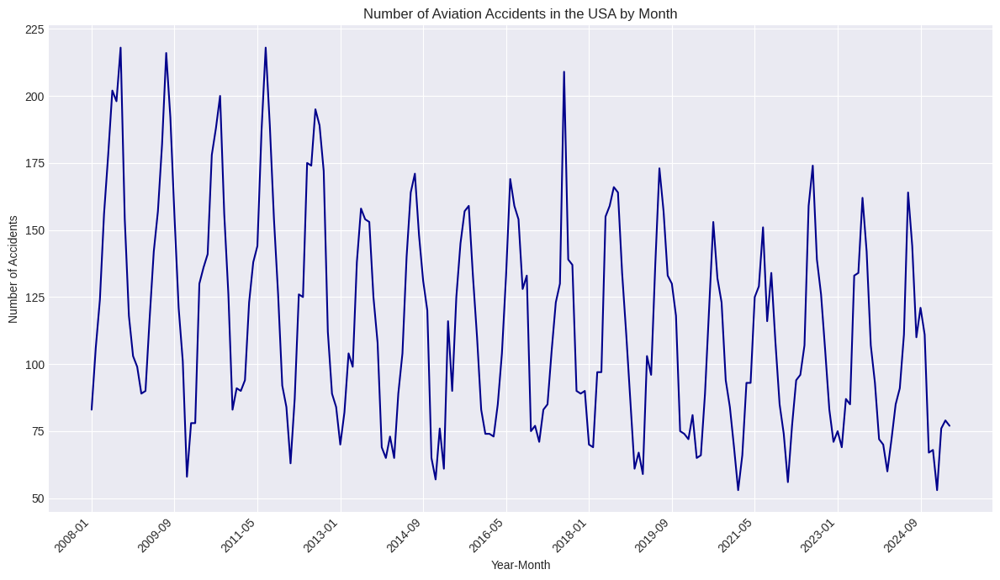

In [ ]:
df_mergerd = df[(df['ev_country'] == 'USA')].groupby(['ev_year', 'ev_month']).size().reset_index(name='Count')
# Adjust for incomplete data in the file in April
# From https://data.ntsb.gov/carol-main-public/query-builder?month=4&year=2025
df_mergerd.loc[(df_mergerd['ev_year'] == 2025) & (df_mergerd['ev_month'] == 4), 'Count'] = 77

all_labels = df_mergerd.apply(lambda row: f"{int(row['ev_year'])}-{int(row['ev_month']):02d}", axis=1).tolist()

# Plotting
plt.figure(figsize=(12, 7))
plt.plot(all_labels, df_mergerd['Count'], color = 'darkblue')

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(nbins=12))

plt.xlabel('Year-Month')
plt.ylabel('Number of Accidents')
plt.title('Number of Aviation Accidents in the USA by Month')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### Time Series Prediction

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, InputLayer, Dropout
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Create sequences for LSTM
def df_to_X_y(data, window_size=3):
  X, y = [], []
  for i in range(len(data) - window_size):
    X.append(data[i:i + window_size, 0])
    y.append(data[i + window_size, 0])
  return np.array(X), np.array(y)


# LSTM model
def LSTMmodel(data, window_size):

  X, y = df_to_X_y(data, window_size)

  # Reshape input to be [samples, time steps, features] for LSTM
  X = np.reshape(X, (X.shape[0], X.shape[1], 1))

  # Split data into training and testing sets
  train_size = int(len(X) * 0.80)
  test_size = len(X) - train_size
  X_train, X_test = X[0:train_size,:], X[train_size:len(X),:]
  y_train, y_test = y[0:train_size], y[train_size:len(y)]

  # Scale data
  scaler_X = MinMaxScaler()
  scaler_Y = MinMaxScaler()

  X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, 1)).reshape(X_train.shape)
  X_test_scaled = scaler_X.transform(X_test.reshape(-1, 1)).reshape(X_test.shape)

  y_train_scaled = scaler_Y.fit_transform(y_train.reshape(-1, 1).reshape(-1, 1))
  y_test_scaled = scaler_Y.transform(y_test.reshape(-1, 1).reshape(-1, 1))

  # # Build the LSTM model (for large data)
  # model = Sequential()
  # model.add(InputLayer((window_size, 1)))
  # model.add(LSTM(64))
  # model.add(Dense(8, activation='relu'))
  # model.add(Dropout(0.2))
  # model.add(Dense(1))
  # model.compile(optimizer='adam', loss='mse')

  # # Train the model
  # model.fit(X_train_scaled, y_train_scaled, epochs=50, batch_size=64, verbose=0)

  # Build the LSTM model (for small data)
  model = Sequential()
  model.add(InputLayer((window_size, 1)))
  model.add(LSTM(16))
  model.add(Dense(1))
  model.compile(optimizer='adam', loss='mse')

  # Train the model
  model.fit(X_train_scaled, y_train_scaled, epochs=100, batch_size=8, verbose=0)

  # Make predictions
  train_predict = model.predict(X_train_scaled)
  test_predict = model.predict(X_test_scaled)

  # Invert predictions to original scale
  train_predict = scaler_Y.inverse_transform(train_predict)
  test_predict = scaler_Y.inverse_transform(test_predict)

  return X_train, X_test, y_train, y_test, train_predict, test_predict

#### By month

In [ ]:
# check for mismatches (potentially the event is investigated later)
post_covid['ev_id_month'] = post_covid['ev_id'].astype(str).str[4:6].astype(int)
mismatched_months = post_covid[post_covid['ev_id_month'] != post_covid['ev_month']]
mismatched_months

/tmp/ipython-input-27-2551249943.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  post_covid['ev_id_month'] = post_covid['ev_id'].astype(str).str[4:6].astype(int)


,ev_id,ntsb_no,ev_type,ev_date,ev_time,ev_country,ev_year,ev_month,on_ground_collision,apt_dist,...,acft_year,fuel_on_board,unmanned,acft_fatal_count,acft_minor_count,acft_none_count,acft_serious_count,acft_total_person_count,acft_injured_person_count,ev_id_month
20720,20200206X43510,WPR20CA087,ACC,01/12/20 00:00:00,410.0,USA,2020,1,NaN,1.0,...,1981.0,40.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,2
20745,20200204X12350,ERA20CA099,ACC,01/30/20 00:00:00,1915.0,USA,2020,1,NaN,0.0,...,1963.0,40.0,0.0,0.0,0.0,3.0,0.0,3.0,0.0,2
20810,20200301X22718,CEN20FA108,ACC,02/29/20 00:00:00,149.0,USA,2020,2,NaN,1.0,...,1974.0,NaN,0.0,1.0,0.0,0.0,0.0,1.0,1.0,3
20815,20200301X82907,ERA20CA117,ACC,02/29/20 00:00:00,1425.0,USA,2020,2,NaN,0.0,...,1974.0,NaN,0.0,0.0,0.0,1.0,1.0,2.0,1.0,3
20833,20200309X32139,WPR20CA103,ACC,02/28/20 00:00:00,2045.0,USA,2020,2,NaN,0.0,...,2019.0,30.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29016,20250401199948,CEN25LA143,ACC,03/25/25 00:00:00,1249.0,USA,2025,3,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
29022,20250403199956,CEN25LA145,ACC,03/24/25 00:00:00,1530.0,USA,2025,3,NaN,0.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
29025,20250403199961,ANC25LA030,ACC,03/07/25 00:00:00,2330.0,USA,2025,3,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
29031,20250407199974,ANC25LA031,ACC,10/02/24 00:00:00,2000.0,USA,2024,10,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4


In [ ]:
merged_accidents_by_month = post_covid.groupby(['ev_year', 'ev_month']).size().reset_index(name='Count')

# Adjust for incomplete data in the file in April
# From https://data.ntsb.gov/carol-main-public/query-builder?month=4&year=2025
merged_accidents_by_month.loc[(merged_accidents_by_month['ev_year'] == 2025) & (merged_accidents_by_month['ev_month'] == 4), 'Count'] = 77

merged_accidents_by_month

,ev_year,ev_month,Count
0,2020,1,72
1,2020,2,81
2,2020,3,65
3,2020,4,66
4,2020,5,89
...,...,...,...
59,2024,12,68
60,2025,1,53
61,2025,2,76
62,2025,3,79


In [ ]:
# Prepare data for LSTM
data = merged_accidents_by_month['Count'].values.reshape(-1, 1)

window_size = 12  # Number of previous months to consider

all_labels = merged_accidents_by_month.apply(lambda row: f"{int(row['ev_year'])}-{int(row['ev_month']):02d}", axis=1).tolist()

X_train, X_test, y_train, y_test, train_predict, test_predict = LSTMmodel(data, window_size)

# Calculate the indices for the labels based on window_size and the split
train_labels_start_index = window_size
train_labels_end_index = window_size + len(y_train)
test_labels_start_index = window_size + len(y_train)
test_labels_end_index = window_size + len(y_train) + len(y_test)

# Slice the all_labels list accordingly
train_plot_labels = all_labels[train_labels_start_index:train_labels_end_index]
test_plot_labels = all_labels[test_labels_start_index:test_labels_end_index]

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


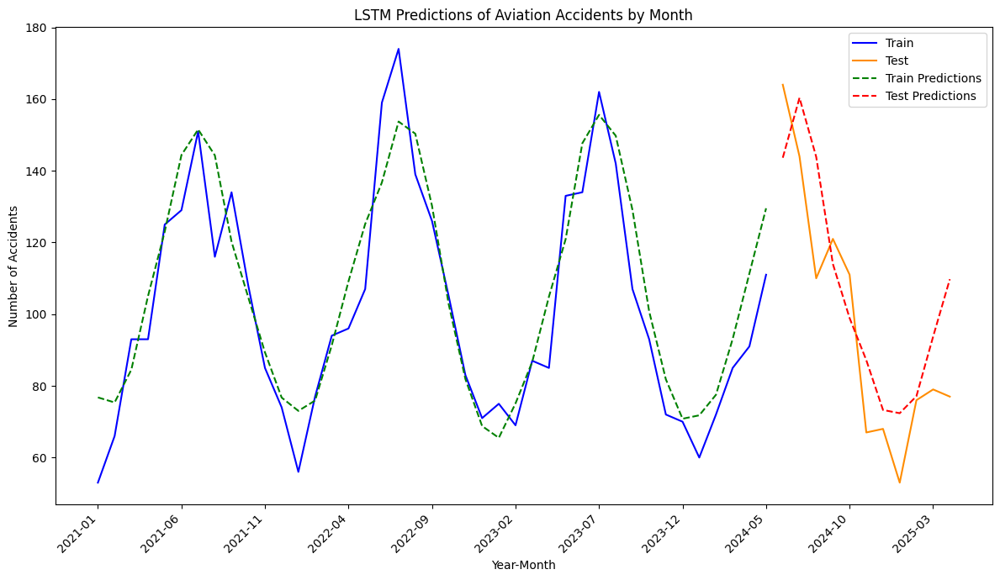

In [ ]:
# Plotting
plt.figure(figsize=(12, 7))
plt.plot(train_plot_labels, y_train, label='Train', color='blue')
plt.plot(test_plot_labels, y_test, label='Test', color='darkorange')
plt.plot(train_plot_labels, train_predict, label='Train Predictions', color='green', linestyle='--')
plt.plot(test_plot_labels, test_predict, label='Test Predictions', color='red', linestyle='--')

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(nbins=12))

plt.xlabel('Year-Month')
plt.ylabel('Number of Accidents')
plt.title('LSTM Predictions of Aviation Accidents by Month')
plt.legend(loc='upper right')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [ ]:
mae = mean_absolute_error(y_test, test_predict)
print(f'Mean Absolute Error (MAE): {mae:.2f}')

Mean Absolute Error (MAE): 16.65


### Heatmap Visualization

In [2]:
post_covid = pd.read_csv('../data/ntsb_processed/master.csv')
post_covid = post_covid[(post_covid['ev_country'] == 'USA') & (post_covid['ev_year'] >= 2020)]

In [3]:
'''
Commented out because our cleaned data has latitude/longitude of the desired form, no longer DDMMSSX

# Parse latitude (from 342558N to DDMMSSX)
def parse_lat(s):
    deg = float(s[:2])
    min = float(s[2:4])
    sec = float(s[4:6])
    dec = deg + min/60 + sec/3600
    return dec if s[-1] == 'N' else -dec

# Parse longitude (from 0119505W to DDDMMSSX)
def parse_lon(s):
    deg = float(s[:3])
    min = float(s[3:5])
    sec = float(s[5:7])
    dec = deg + min/60 + sec/3600
    return dec if s[-1] == 'E' else -dec
'''

# Apply conversion to DataFrame
post_covid = post_covid[post_covid['ev_country'] == 'USA']
print(f"Total rows: {len(post_covid)}, removed {len(post_covid[post_covid['latitude'].isna() | post_covid['longitude'].isna()])} NA lat/lon")
heatmap_df = post_covid[~(post_covid['latitude'].isna() | post_covid['longitude'].isna())].copy()
heatmap_df['formatted_latitude'] = heatmap_df['latitude'] # As our lat/lon is of the desired format, we no longer parse the commented out function.
heatmap_df['formatted_longitude'] = heatmap_df['longitude']
heatmap_df.fillna({'acft_injured_person_count':0}, inplace=True)

Total rows: 6361, removed 99 NA lat/lon


In [4]:
us_center = [37.0902, -95.7129]
# Create base map
m = folium.Map(location=us_center, zoom_start=4, tiles='cartodbpositron')

# Prepare heatmap data (latitude, longitude, intensity)
heat_data = [[row['formatted_latitude'], row['formatted_longitude']] for i, row in heatmap_df.iterrows()]

# Add heatmap layer
HeatMap(heat_data, radius=15, blur=10).add_to(m)

# Save
m.save('../img/heatmap.html')

In [5]:
display(m)

In [7]:
# Create interactive map
m = folium.Map(location=us_center,
               zoom_start=4,
               tiles='cartodbpositron',
               control_scale=True)

# Add heatmap layer
heat_data = [[row['formatted_latitude'], row['formatted_longitude']] for _, row in heatmap_df.iterrows()]
heat_layer = HeatMap(heat_data,
                     name='Heatmap',
                     radius=15,
                     blur=10,
                     gradient={0.4: 'blue', 0.65: 'lime', 1: 'red'})
heat_layer.add_to(m)

# Add markers with popups
marker_cluster = MarkerCluster(name='Locations').add_to(m)
for idx, row in heatmap_df.iterrows():
    folium.Marker(
        location=[row['formatted_latitude'], row['formatted_longitude']],
        popup=f"Injured: <b>{row['acft_injured_person_count']}</b><br>"
              f"Lat: {row['latitude']}<br>"
              f"Lon: {row['longitude']}<br>",
              # f"Decimal: {row['formatted_latitude']:.5f}, {row['formatted_longitude']:.5f}",
        tooltip='Click for details',
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(marker_cluster)

# Add layer control and title
folium.LayerControl(position='topright', collapsed=False).add_to(m)
m.get_root().html.add_child(folium.Element(
    '<h2 align="center" style="font-size:20px"><b>Geographic Points Heatmap</b></h2>'))

# Save
m.save('../img/interactive_heatmap.html')

In [8]:
display(m)